In [1]:
# !pip install opencv-python

In [2]:
import cv2 
import numpy as np
import matplotlib.pyplot as plt
import random

In [3]:
img1 = cv2.imread('apples.jpg',0)
# cv2.imshow("apples", img1)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

In [4]:
img2 = cv2.imread('tint1.jpg',0)
# cv2.imshow("flower", img2)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

In [5]:
# imgpmg = cv2.imread('tint1.jpg', as_gray = True)
# plt.imshow(imgpmg)


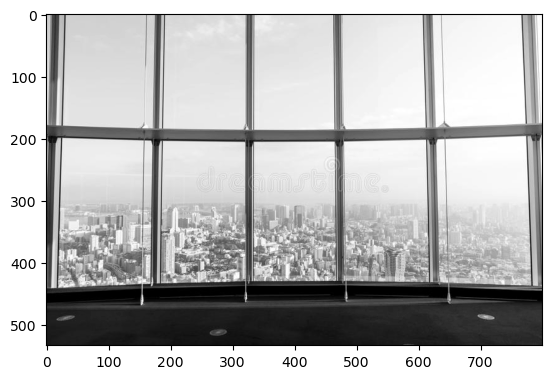

In [163]:
img4 = cv2.imread('tower.jpg',0)
plt.imshow(img4, cmap = 'gray')

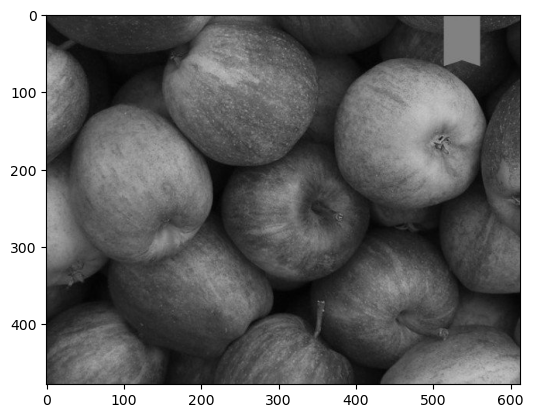

In [6]:
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))

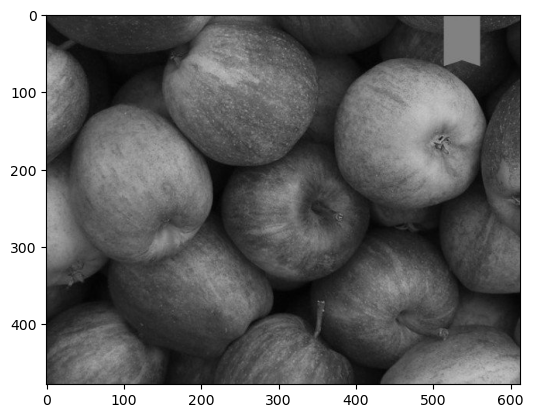

In [7]:
plt.imshow(cv2.cvtColor(img1,cv2.COLOR_BGR2RGB))

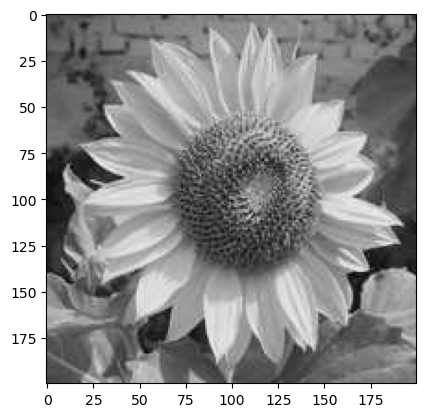

In [8]:
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))

In [9]:
img3 = cv2.resize(img2, (612,478))

In [10]:
# gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
# cv2.imshow('apples', gray1)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

In [11]:
img1.shape

(478, 612)

In [12]:
img2.shape

(200, 200)

In [13]:
img3.shape

(478, 612)

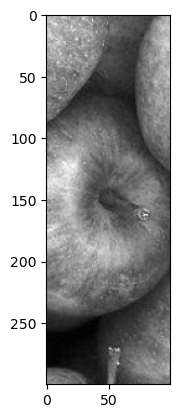

In [14]:
crop1 = img1[100:400, 300:400]
plt.imshow(crop1, cmap = 'gray')

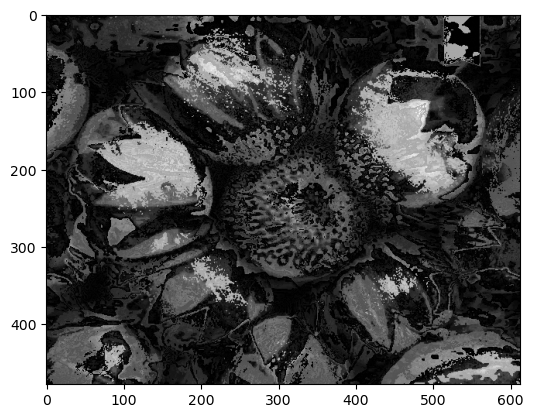

In [15]:
# and1 = cv2.bitwise_and(img1,img3)
# cv2.imshow('AND operation', and1)
plt.imshow(cv2.bitwise_and(img1,img3), cmap = 'gray')

Text(0.5, 1.0, 'OR Operation')

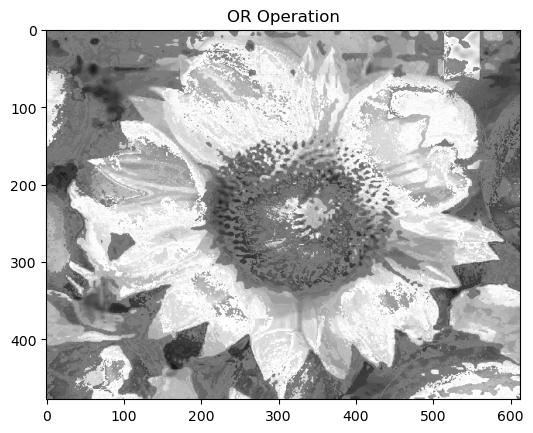

In [16]:
or1 = cv2.bitwise_or(img1,img3)
# gray1 = cv2.cvtColor(or1, cv2.COLOR_BGR2GRAY)
# cv2.imshow('OR op', or1)
plt.imshow(cv2.cvtColor(or1, cv2.COLOR_BGR2RGB))
plt.title("OR Operation")

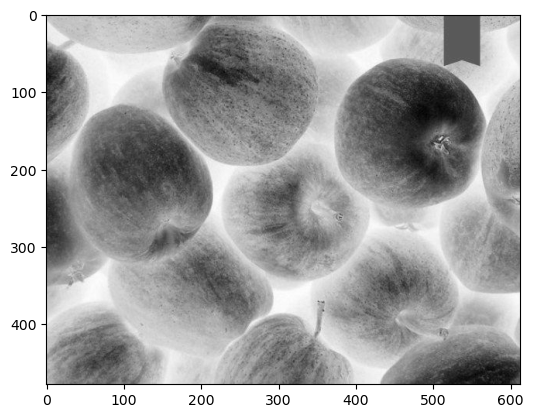

In [17]:
not1 = cv2.bitwise_not(img1,img3)
plt.imshow(not1, cmap = 'gray')

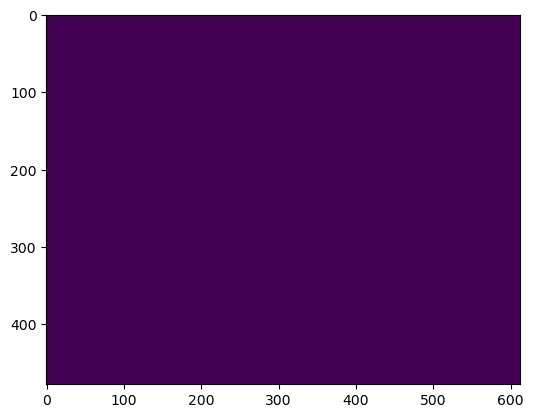

In [50]:
xor1 = cv2.bitwise_xor(img1,img3)
plt.imshow(xor1)

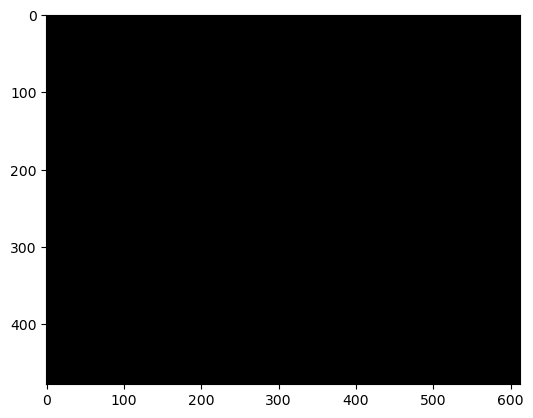

In [54]:
add1 = cv2.add(img1,img3)
# cv2.imshow('ADDED', add1)
plt.imshow(cv2.add(img1,img3), cmap='gray')

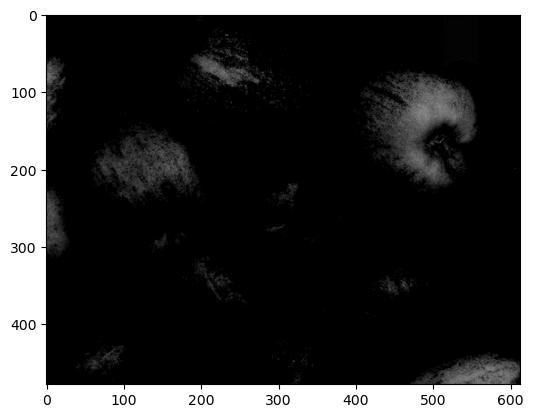

In [20]:
sub1 = cv2.subtract(img1,img3)
# cv2.imshow('Sub', sub1)
plt.imshow(cv2.cvtColor(sub1,cv2.COLOR_BGR2RGB))

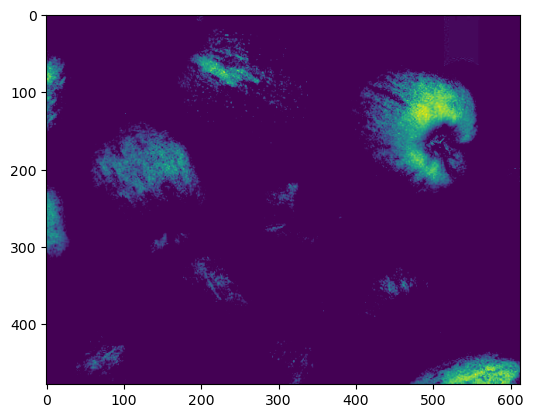

In [21]:
plt.imshow(sub1)

In [22]:
img1.min()

1

In [23]:
img1.max()

199

 Thresholding

In [24]:
h,r = img1.shape
print(h,r)


478 612


In [25]:
thr_img1 = np.zeros(img1.shape)

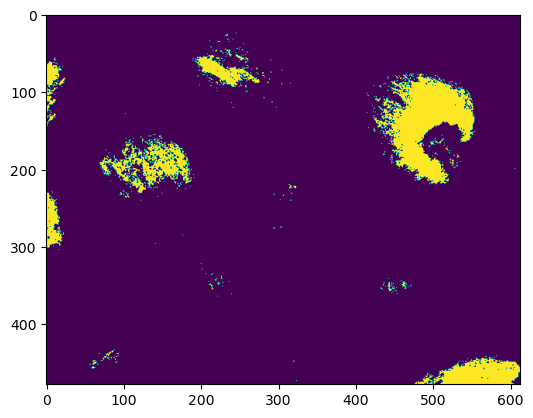

In [26]:
t = 150
l = 0
m = 0

for l in range(h):
    for m in range(r):
        if img1[l][m] < t:
            thr_img1[l][m] = 0
        else:
            thr_img1[l][m] = 255
            
plt.imshow(thr_img1)



Gray level Slicing

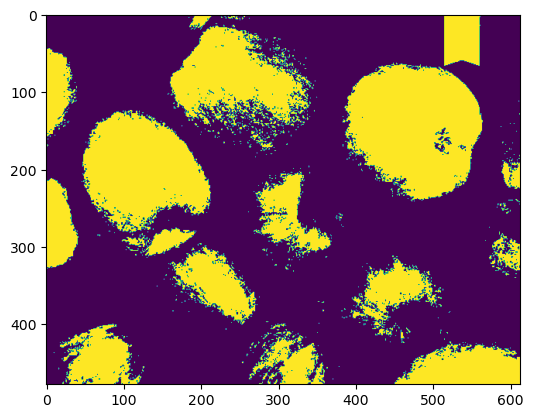

In [27]:
a1 = 100
a2 = 150
gls = np.zeros(img1.shape)

for l in range(h):
    for m in range(r):
        if(img1[l][m]>=a1 and img1[l][m]<=r):
            gls[l][m] = 255
        else:
            gls[l][m] = 0
            
plt.imshow(gls)

Contrast Stretching

In [28]:
h1,w1 = img1.shape
csi = np.zeros(img1.shape)

In [29]:
a = 50
b = 150
l = 0.5
m = 2
n = 0.3

v = l*a
w = m*(b-a) + (l*a)


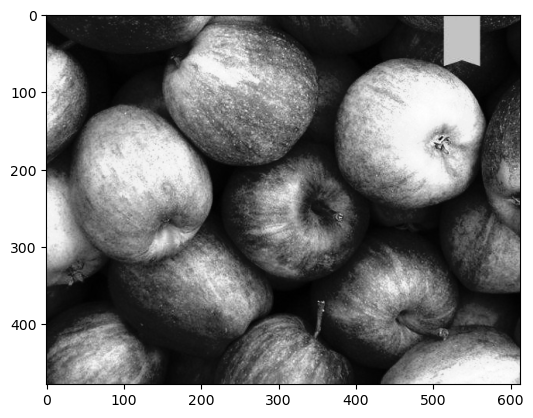

In [30]:
for i in range(h1):
    for j in range(w1):
        
        r = img1[i][j]
        if(r>0 and r <= a):
            csi[i][j] = l*r
        elif(r>=a and r <= b):
            csi[i][j] = m*(r-a) + v
        else:
            csi[i][j] = n*(r-b) + w
            
            
plt.imshow(csi, cmap = 'gray')

In [31]:
# cv2.imshow('Contrast Stretching', csi)

Log Transformation

In [32]:
import math

In [33]:
lti = np.zeros(img1.shape)

In [34]:
c = 50

In [35]:
for i in range(h1):
    for j in range(w1):
        r = img1[i][j]
        
        lti[i][j] = c * math.log(r+1)

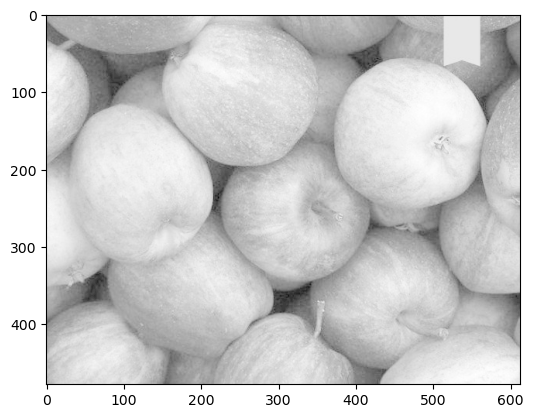

In [36]:
plt.imshow(lti, cmap = 'gray')

Power Transform

In [37]:
pti1 = np.zeros(img1.shape)
pti2 = np.zeros(img1.shape)
l1 = 1.1
l2 = 0.9


for i in range(h1):
    for j in range(w1):
        r = img1[i][j]
        
        pti1[i][j] = r ** l1
        
        
for i in range(h1):
    for j in range(w1):
        r = img1[i][j]
        
        pti2[i][j] = r ** l2
        


        

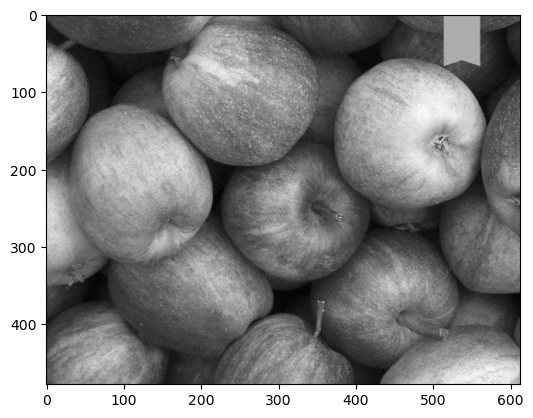

In [38]:
plt.imshow(pti2, cmap = 'gray')

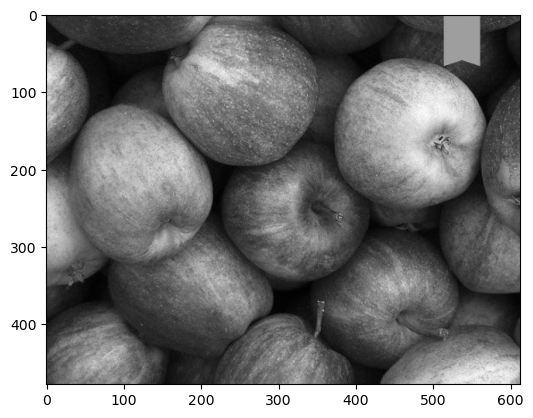

In [39]:
plt.imshow(pti1, cmap='gray')

Avg Filtering

In [40]:
noise = np.random.normal(0,50, size = img1.shape)
noisy_img = noise + img1

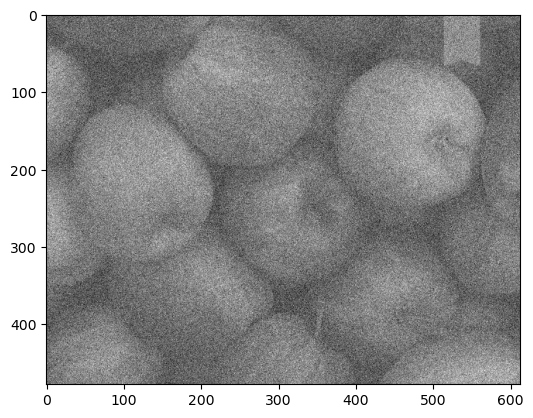

In [105]:
plt.imshow(noisy_img, cmap = 'gray')

In [41]:
mask = np.ones([3,3], dtype = int)
mask = mask/9

In [42]:
avgf = np.zeros(img1.shape)

In [43]:
for i in range(1, h1-1):
    for j in range(1, w1-1):
        temp = noisy_img[i-1, j-1]*mask[0, 0]+noisy_img[i-1, j]*mask[0, 1]+noisy_img[i-1, j + 1]*mask[0, 2]+noisy_img[i, j-1]*mask[1, 0]+ noisy_img[i, j]*mask[1, 1]+noisy_img[i, j + 1]*mask[1, 2]+noisy_img[i + 1, j-1]*mask[2, 0]+noisy_img[i + 1, j]*mask[2, 1]+noisy_img[i + 1, j + 1]*mask[2, 2]
        avgf[i, j]= temp

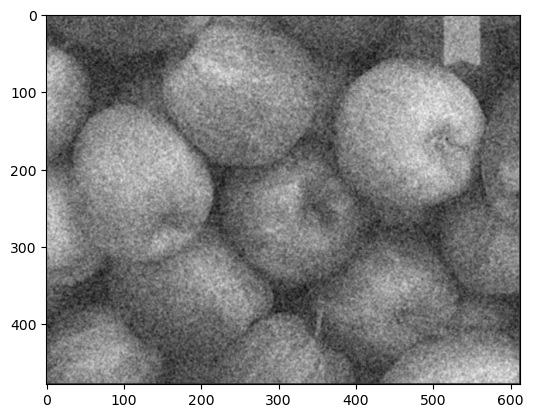

In [44]:
plt.imshow(avgf, cmap='gray')

Median Filtering

In [45]:
saltpepper=img1.copy()
pixel = 1000
for i in range(pixel):
    y=random.randint(0, h1-1)
    x=random.randint(0, w1-1)
    saltpepper[y][x] = 255
pixel = 1000
for i in range(pixel):
    y=random.randint(0, h1-1)
    x=random.randint(0, w1-1)
    saltpepper[y][x] = 0


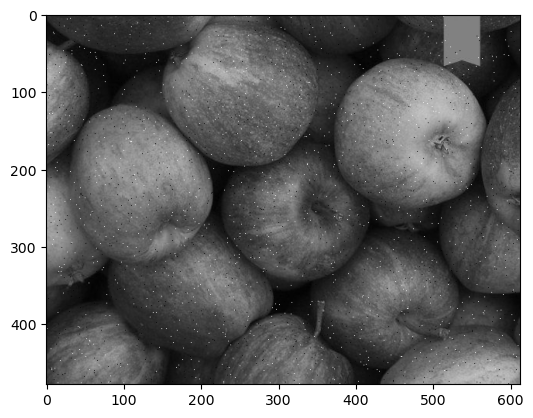

In [46]:
plt.imshow(cv2.cvtColor(saltpepper, cv2.COLOR_BGR2RGB))

In [206]:
sp_removed = np.zeros(img1.shape)
  
for i in range(1, h1-1):
    for j in range(1, w1-1):
        temp = [saltpepper[i-1, j-1],
               saltpepper[i-1, j],
               saltpepper[i-1, j + 1],
               saltpepper[i, j-1],
               saltpepper[i, j],
               saltpepper[i, j + 1],
               saltpepper[i + 1, j-1],
               saltpepper[i + 1, j],
               saltpepper[i + 1, j + 1]]
          
        temp = sorted(temp)
        sp_removed[i, j]= temp[4]

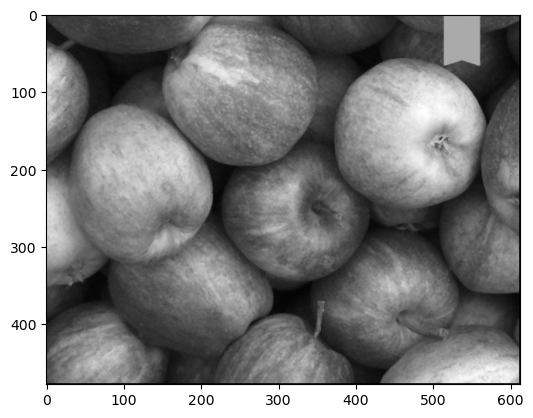

In [207]:
plt.imshow(sp_removed,  cmap = 'gray')


High Pass and High Boost filter

In [58]:
filt = np.ones([3,3], dtype = int)
filt = -filt
filt[1,1] = 8 * filt[1,1]
print(filt)

[[-1 -1 -1]
 [-1 -8 -1]
 [-1 -1 -1]]


In [60]:
hpf = np.zeros(img1.shape)

In [62]:
h,w = img1.shape

In [69]:
for i in range(1,h-1):
    for j in range(1,w-1):
        temp = (img1[i-1,j-1]*filt[0,0] + img1[i-1,j]*filt[0,1] + img1[i-1,j+1]*filt[0,2] + img1[i,j-1]*filt[1,0] + img1[i,j]*filt[1,1] + img1[i,j+1]*filt[1,2] + img1[i+1,j-1]*filt[2,0] + img1[i+1,j]*filt[2,1] + img1[i+1,j+1]*filt[2,2])
        
        hpf[i,j] = temp

Text(0.5, 1.0, 'High Pass Filter')

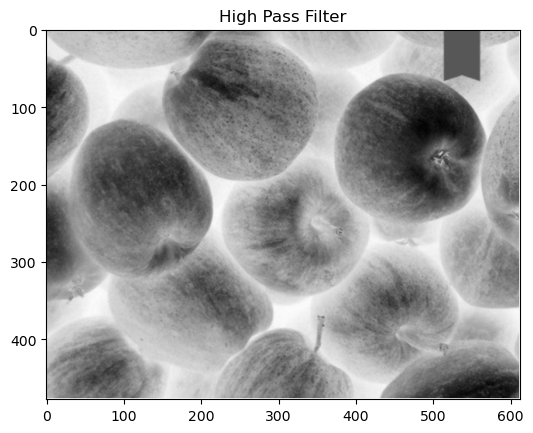

In [71]:
plt.imshow(hpf, cmap = 'gray')
plt.title("High Pass Filter")

In High Boost Filter, finer details are highlighted thus we are able to see bg

In [74]:
f = 1.5
filt1 = np.ones([3,3], dtype = int)
filt1 = -filt1
filt1[1,1] = -(8+f) * filt1[1,1]
print(filt1)

[[-1 -1 -1]
 [-1  9 -1]
 [-1 -1 -1]]


In [75]:
hbf = np.zeros(img1.shape)

In [76]:
for i in range(1,h-1):
    for j in range(1,w-1):
        temp = (img1[i-1,j-1]*filt1[0,0] + img1[i-1,j]*filt1[0,1] + img1[i-1,j+1]*filt1[0,2] + img1[i,j-1]*filt1[1,0] + img1[i,j]*filt1[1,1] + img1[i,j+1]*filt1[1,2] + img1[i+1,j-1]*filt1[2,0] + img1[i+1,j]*filt1[2,1] + img1[i+1,j+1]*filt1[2,2])
        
        hbf[i,j] = temp

Text(0.5, 1.0, 'High Boost Filter')

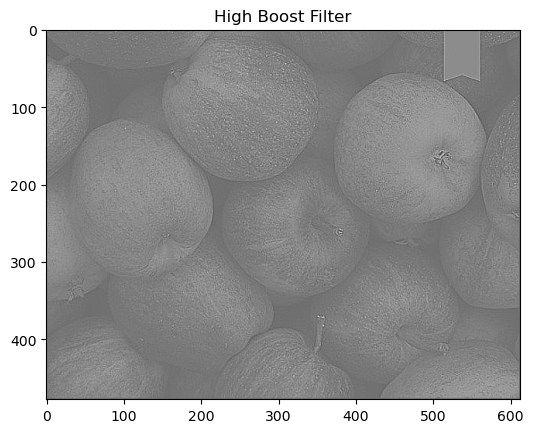

In [78]:
plt.imshow(hbf, cmap = 'gray')
plt.title("High Boost Filter")

IN High Boost Filter image id enhanced and bg is retained

Histogram Stretching

In [81]:
hist_str = np.zeros(img1.shape)

In [82]:
rmin = img1.min()
rmax = img1.max()
smin = 0
smax = 255

In [84]:
for i in range(h):
    for j in range(w):
        r = img1[i][j]
        
        v = ((smax - smin)/(rmax - rmin))*((r -rmin)+smin)
        
        hist_str[i][j] = v

Text(0.5, 1.0, 'Histogram Stretched Image')

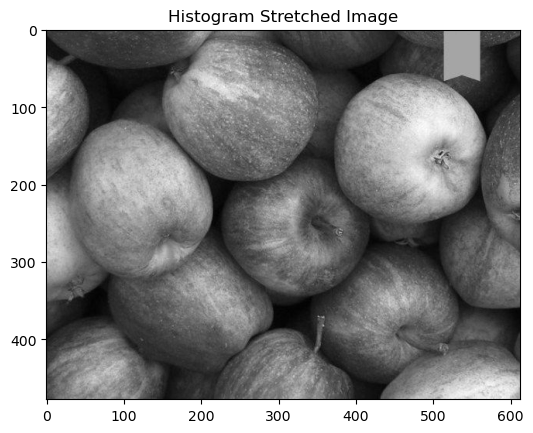

In [85]:
plt.imshow(hist_str, cmap = 'gray')
plt.title('Histogram Stretched Image')

In [87]:
hist_max = hist_str.max()
hist_min = hist_str.min()
print(hist_max, hist_min)

255.0 0.0


HIST COMPARISON

In [90]:
import matplotlib.pyplot as plt
def hist_plot(img):
  m,n = img.shape
  count =[]
  r = []
  for k in range(0, 256):
    r.append(k)
    count1 = 0
    for i in range(m):
      for j in range(n):
        if img[i, j]== k:
          count1+= 1
    count.append(count1)  
  return (r, count)

Text(0.5, 1.0, 'Histogram of the Original Image')

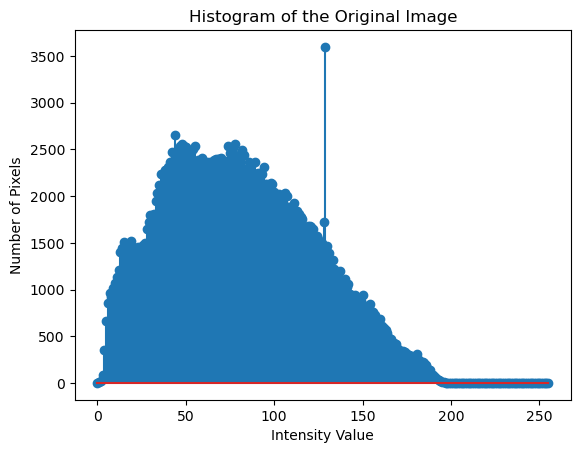

In [91]:
r,count = hist_plot(img1)
plt.stem(r,count)
plt.xlabel('Intensity Value')
plt.ylabel('Number of Pixels')
plt.title('Histogram of the Original Image')

Text(0.5, 1.0, 'Histogram of the Stretched Image')

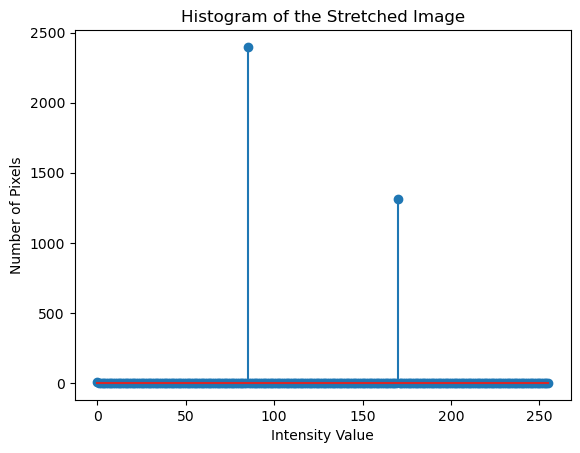

In [92]:

r,count = hist_plot(hist_str)
plt.stem(r,count)
plt.xlabel('Intensity Value')
plt.ylabel('Number of Pixels')
plt.title('Histogram of the Stretched Image')

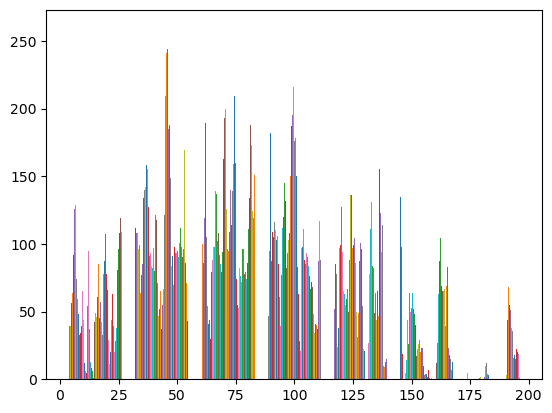

In [93]:
plt.hist(img1, bins=7)
plt.show()

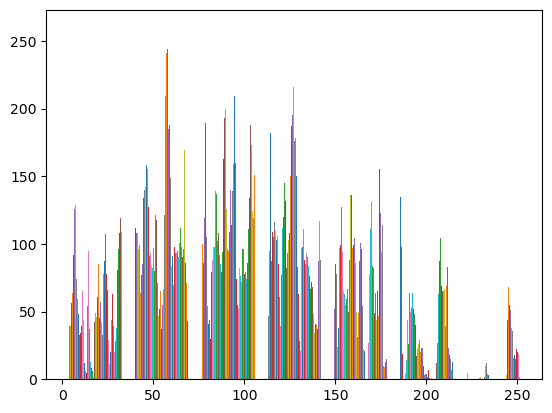

In [94]:
plt.hist(hist_str, bins=7)
plt.show()

Histogram Equalisation

In [97]:
n = []
nk = []
pdf = []
cdf = [0]
c = 0
cdf255 = []
op=[]

for i in range(0,256):
  n.append(i)
  nk.append(np.count_nonzero(img1 == i))

s = sum(nk)

for i in range(0,256):
  pdf.append(nk[i]/s)

for i in range(1,256):
  c = c + pdf[i-1]
  cdf.append(c)

for i in range(0,256):
  cdf255.append(cdf[i]*255)

for i in range(0,256):
  op.append(math.ceil(cdf255[i]))

In [98]:
for i in range(160,170):
  print(n[i] , nk[i], pdf[i], cdf[i], cdf255[i], op[i])

160 686 0.0023450105286187 0.9633583558946588 245.656380753138 246
161 611 0.0020886318265102414 0.9657033664232775 246.25435843793576 247
162 586 0.0020031722591407554 0.9677919982497877 246.78695955369585 247
163 563 0.001924549457160828 0.9697951705089284 247.29776847977675 248
164 538 0.0018390898897913419 0.9717197199660892 247.78852859135273 248
165 476 0.0016271501627150163 0.9735588098558805 248.25749651324952 249
166 475 0.0016237317800202368 0.9751859600185955 248.67241980474185 249
167 419 0.001432302349112588 0.9768096917986158 249.08647140864701 250
168 427 0.0014596494106708234 0.9782419941477284 249.45170850767073 250
169 420 0.0014357207318073672 0.9797016435583992 249.8239191073918 250


In [100]:
hist_equalized = np.zeros(img1.shape)

h,w = img1.shape

for i in range(h):
  for j in range(w):
    r = img1[i][j]
    hist_equalized[i][j] = op[r]

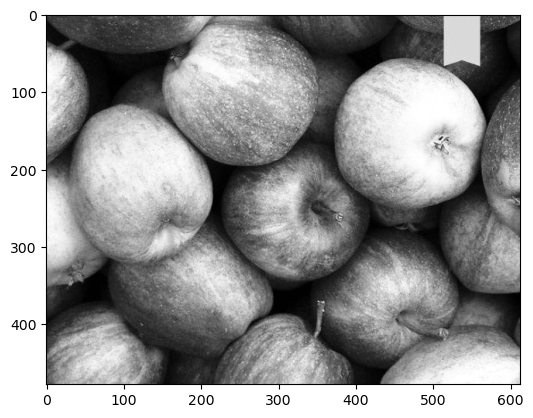

In [101]:
plt.imshow(hist_equalized, cmap = 'gray')

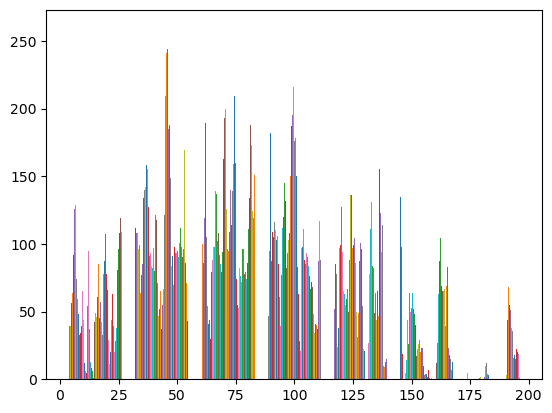

In [103]:
plt.hist(img1, bins = 7)
plt.show()

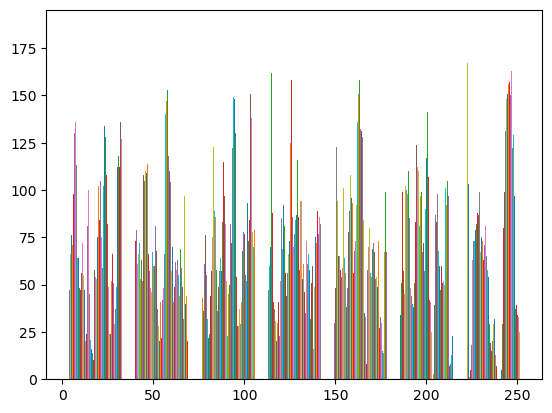

In [104]:
plt.hist(hist_equalized, bins = 7)
plt.show()

Ideal Low Pass Filter

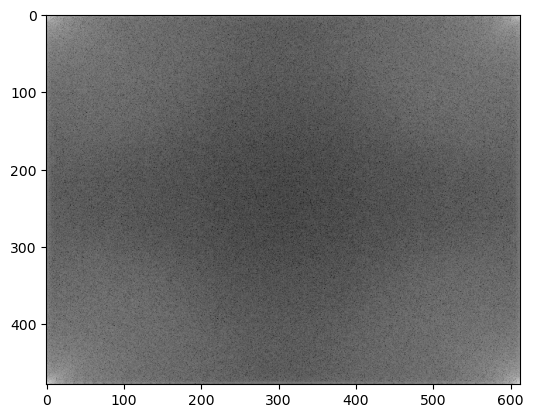

In [118]:
F = np.fft.fft2(img1)
plt.imshow(np.log1p(np.abs(F)), cmap= 'gray')


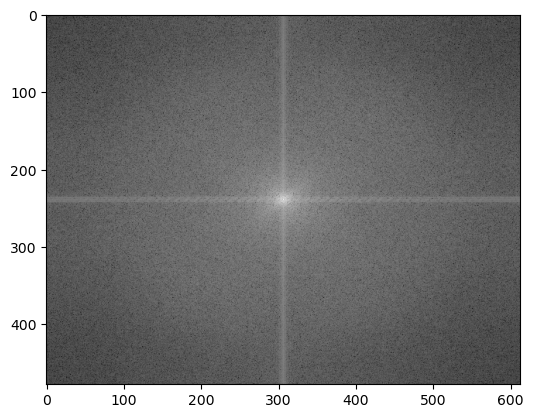

In [119]:
Fshift = np.fft.fftshift(F)
plt.imshow(np.log1p(np.abs(Fshift)), cmap = 'gray')

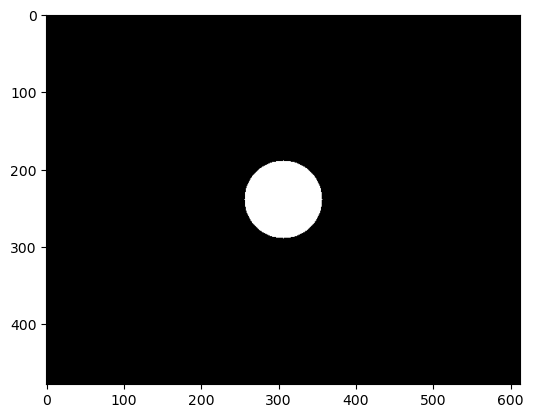

In [122]:
M,N = img1.shape

H = np.zeros(img1.shape, dtype = np.float32)
D0 = 50

for u in range(M):
    for v in range(N):
        D = np.sqrt((u-M/2)**2 + (v - N/2)**2)
        if D <= D0:
            H[u,v] = 1
        else:
            H[u,v] = 0
            
plt.imshow(H, cmap = 'gray')

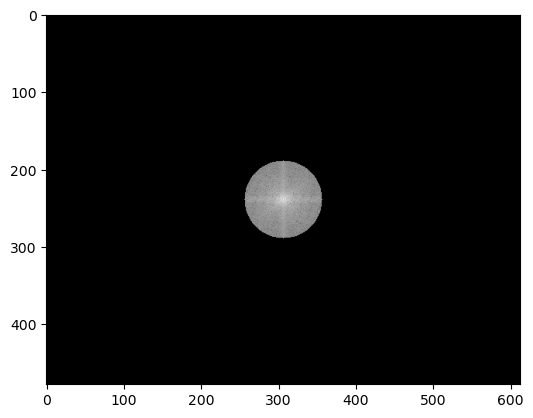

In [123]:
Gshift = H * Fshift
plt.imshow(np.log1p(np.abs(Gshift)), cmap = 'gray')

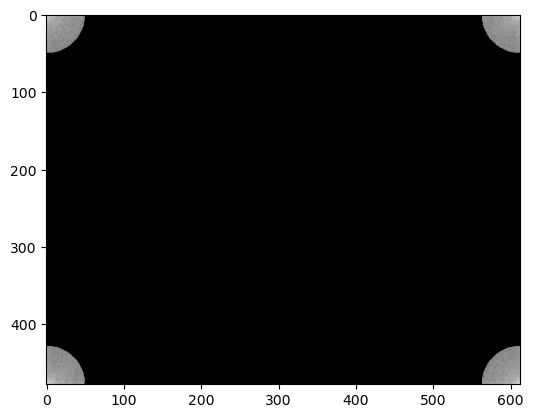

In [124]:
G = np.fft.ifftshift(Gshift)
plt.imshow(np.log1p(np.abs(G)), cmap = 'gray')

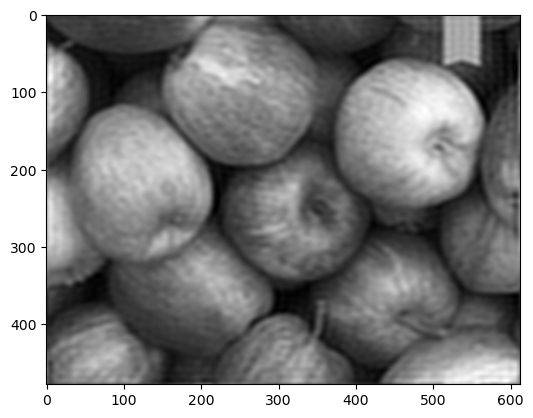

In [128]:
g = np.fft.ifft2(G)
plt.imshow(np.abs(g), cmap = 'gray')

Ideal High Pass

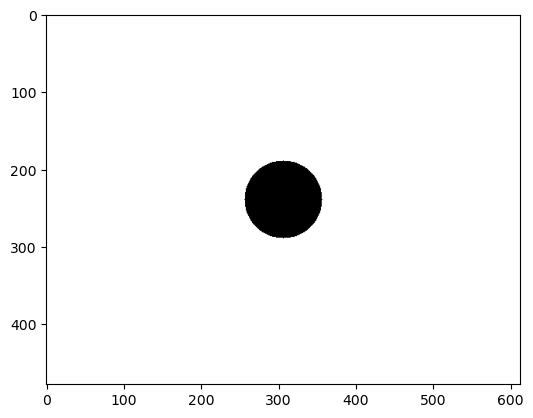

In [129]:
H = 1-H
plt.imshow(H, cmap = 'gray')

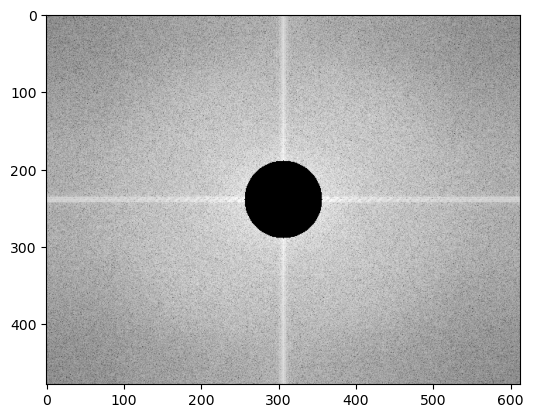

In [130]:
Gshift = H * Fshift
plt.imshow(np.log1p(np.abs(Gshift)), cmap = 'gray')

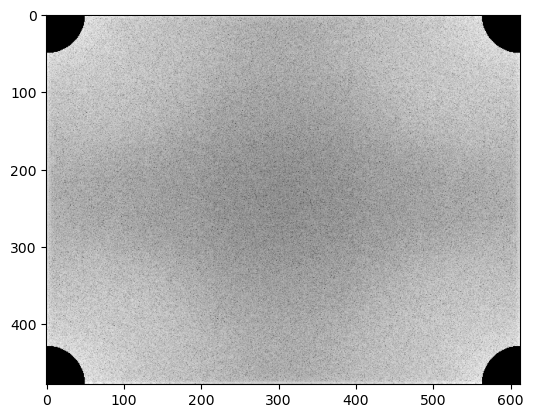

In [131]:
G = np.fft.ifftshift(Gshift)
plt.imshow(np.log1p(np.abs(G)), cmap = 'gray')

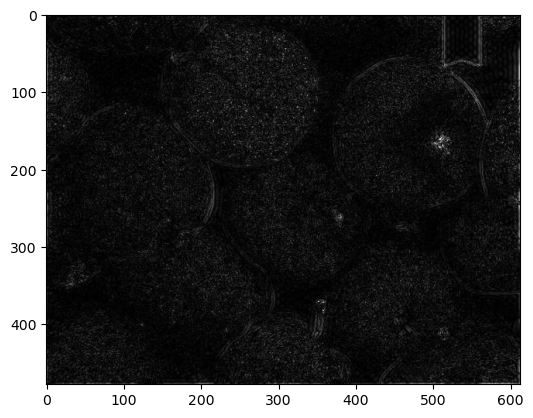

In [132]:
g = np.fft.ifft2(G)
plt.imshow(np.abs(g), cmap = 'gray')

High Pass

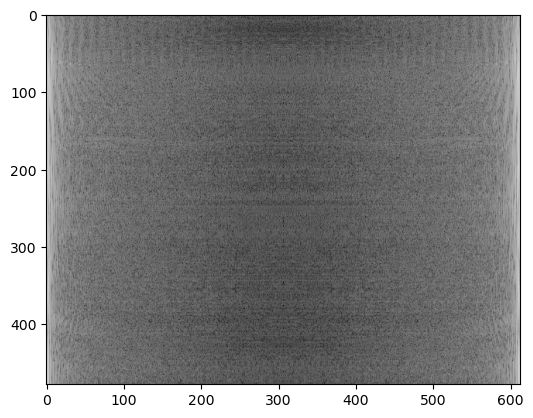

In [153]:
F = np.fft.fft(img3)
plt.imshow(np.log1p(np.abs(F)), cmap ='gray')

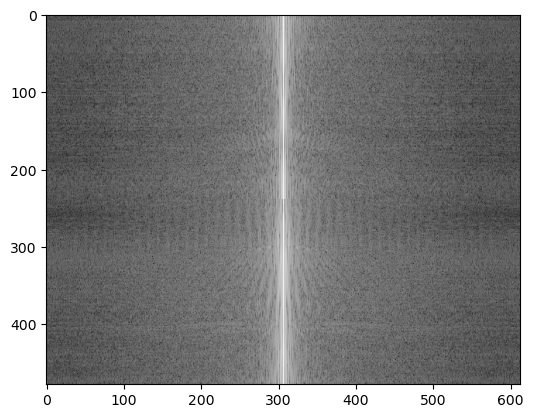

In [154]:
Fshift = np.fft.fftshift(F)
plt.imshow(np.log1p(np.abs(Fshift)), cmap='gray')

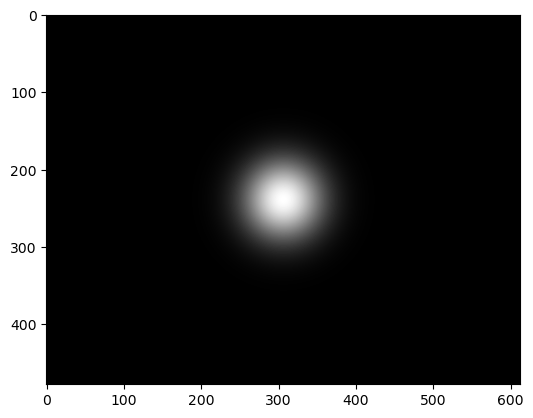

In [155]:
sigma = 50
H = np.zeros(img1.shape)
M,N = img1.shape


for u in range(M):
    for v in range(N):
        D = np.sqrt((u-M/2)**2 + (v-N/2)**2)
        H[u,v] = math.exp((-D**2)/sigma**2)
        
        
plt.imshow(H, cmap = 'gray')

Low Pass Filtering

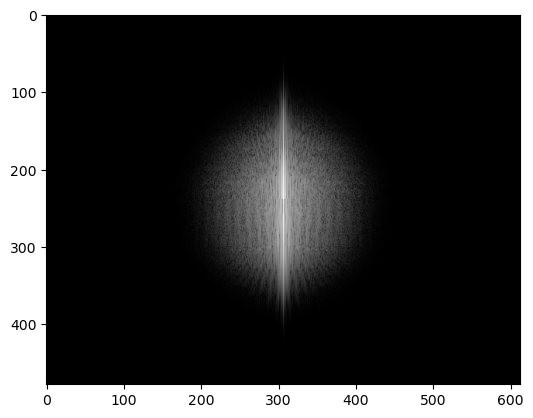

In [156]:
Gshift = Fshift * H
plt.imshow(np.log1p(np.abs(Gshift)), cmap = 'gray')

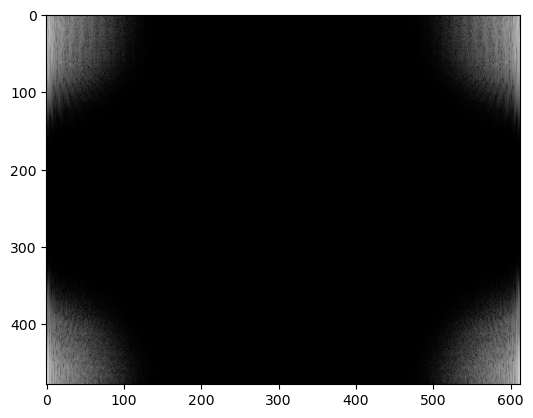

In [157]:
G = np.fft.ifftshift(Gshift)
plt.imshow(np.log1p(np.abs(G)), cmap = 'gray')

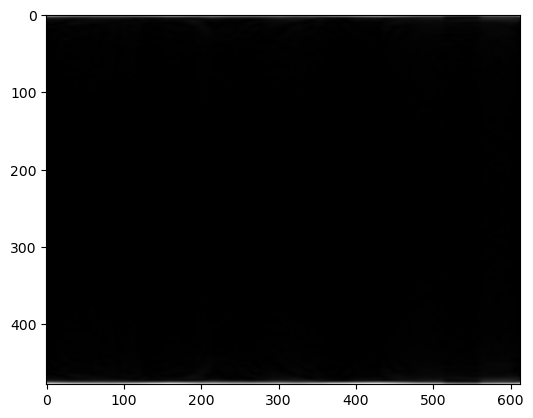

In [158]:
g = np.fft.ifft2(G)
plt.imshow(np.abs(g), cmap = 'gray')

High Pass Filter

In [159]:
H1 = 1 - H

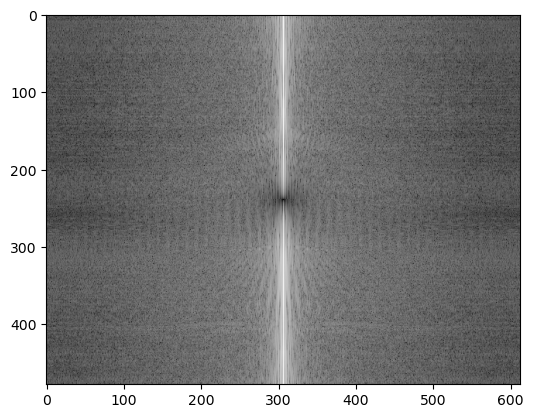

In [160]:
Gshift1 = H1 * Fshift
plt.imshow(np.log1p(np.abs(Gshift1)), cmap = 'gray')

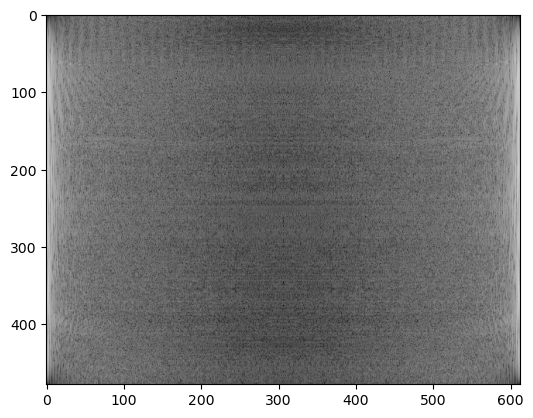

In [161]:
G1 = np.fft.ifftshift(Gshift1)
plt.imshow(np.log1p(np.abs(G1)), cmap = 'gray')

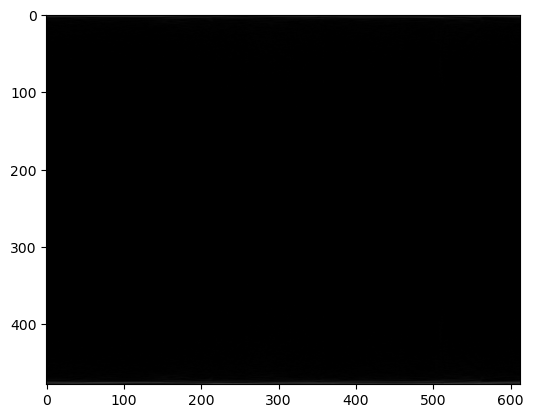

In [162]:
g1 = np.abs(np.fft.ifft2(G1))
plt.imshow(g1, cmap = 'gray')

Prewitt 

In [164]:
kernelx = np.array([[1,1,1] , [0,0,0], [-1,-1,-1]])
kernely = np.array([[-1,0,1], [-1,0,1], [-1,0,1]])

img_prewittx = cv2.filter2D(img4, -1, kernelx)
img_prewitty = cv2.filter2D(img4, -1, kernely)

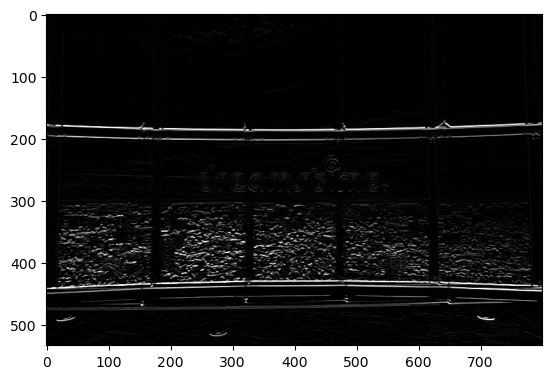

In [165]:
plt.imshow(img_prewittx, cmap = 'gray')

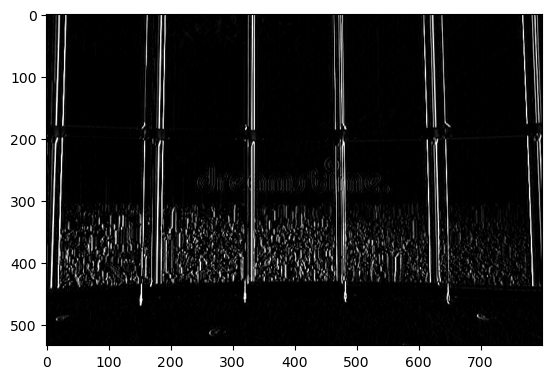

In [166]:
plt.imshow(img_prewitty, cmap = 'gray')

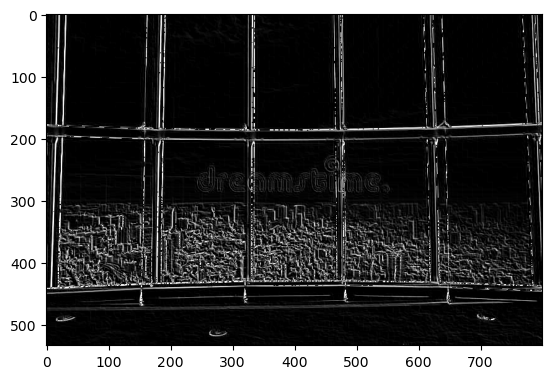

In [167]:
plt.imshow(img_prewittx + img_prewitty, cmap = 'gray')

Sobel

In [168]:
kernel_sx = np.array([[-1,-2,-1], [0,0,0], [1,2,1]])
kernel_sy = np.array([[-1,0,1], [-2,0,2], [-1,0,1]])

img_sobelx = cv2.filter2D(img4, -1, kernel_sx)
img_sobely = cv2.filter2D(img4, -1, kernel_sy)

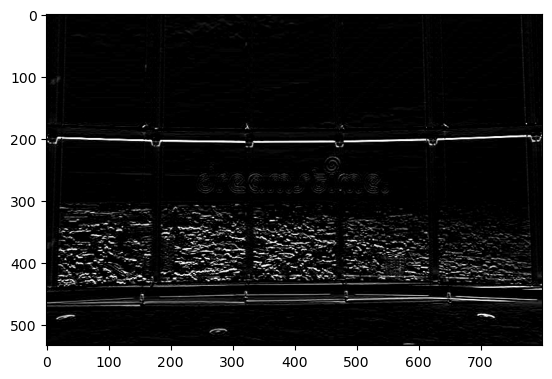

In [169]:
plt.imshow(img_sobelx, cmap = 'gray')

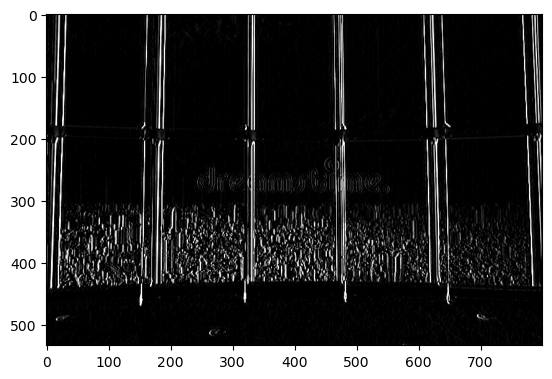

In [170]:
plt.imshow(img_sobely, cmap = 'gray')

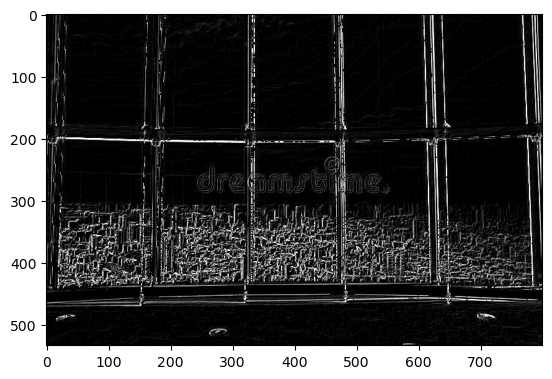

In [171]:
plt.imshow(img_sobelx + img_sobely, cmap = 'gray')

Butterworth

In [172]:
h,w = img1.shape

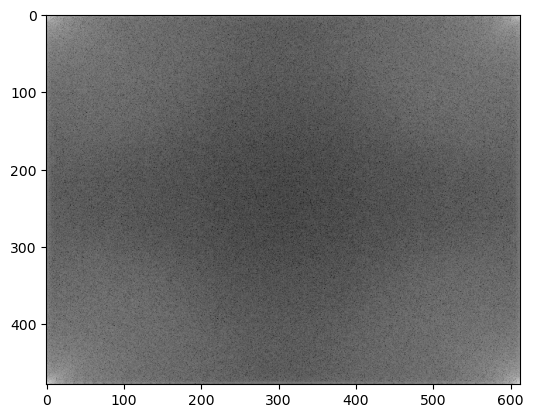

In [173]:
F = np.fft.fft2(img1)
plt.imshow(np.log1p(np.abs(F)), cmap = 'gray')

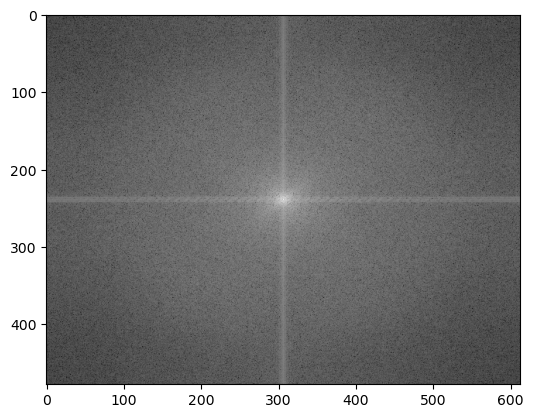

In [174]:
Fshift = np.fft.fftshift(F)
plt.imshow(np.log1p(np.abs(Fshift)), cmap = 'gray')

Butterworth Low Pass

In [180]:
D0 = 50
H = np.zeros(img1.shape, dtype = np.float32)

In [181]:
for u in range(h):
    for v in range(w):
        D = np.sqrt((u-h/2)**2 + (v-w/2)**2)
        H[u,v] = 1/(1 + (D/D0)**2)
        

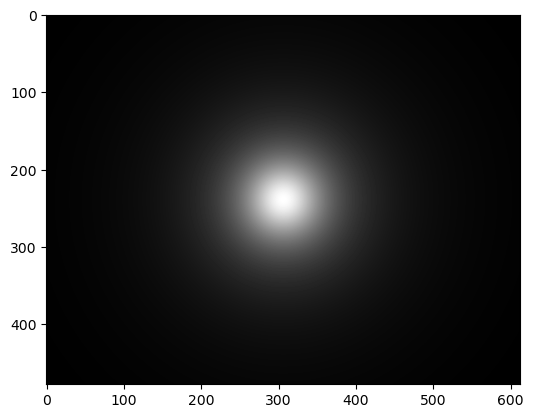

In [182]:
plt.imshow(H, cmap = 'gray')

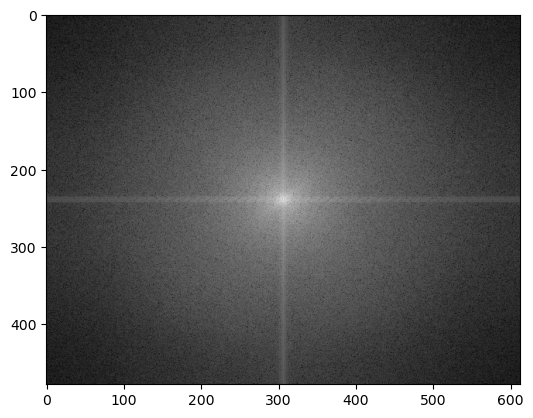

In [184]:
Gshift = H * Fshift
plt.imshow(np.log1p(np.abs(Gshift)), cmap='gray')

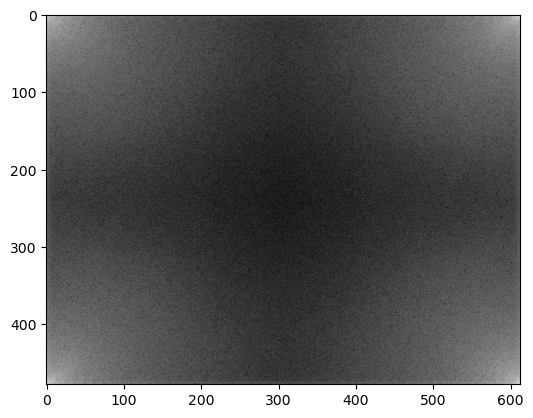

In [185]:
G = np.fft.ifftshift(Gshift)
plt.imshow(np.log1p(np.abs(G)), cmap = 'gray')

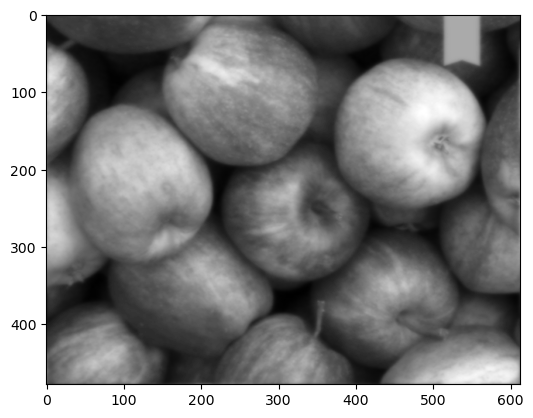

In [186]:
g = np.abs(np.fft.ifft2(G))
plt.imshow(g, cmap = 'gray')

Erosion 

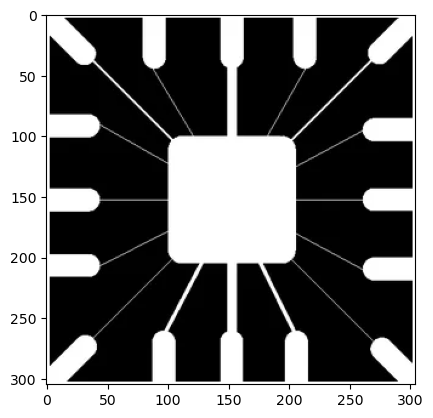

In [189]:
img5 = cv2.imread('e.png', 0)
plt.imshow(img5, cmap = 'gray')

In [191]:
k = 11
SE = np.ones([k,k], dtype = np.uint8)
c = (k-1)//2
h,w = img5.shape
img_erosion = np.zeros((h,w), dtype = np.uint8)

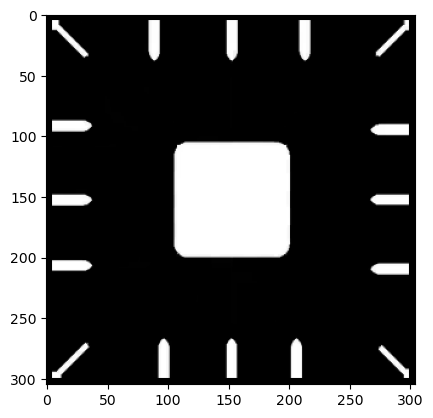

In [192]:
for i in range(c, h-c):
    for j in range(c,w-c):
        temp = img5[i-c : i+c+1, j-c: j+c+1]
        l = temp * SE
        img_erosion[i][j] = np.min(l)
        
plt.imshow(img_erosion, cmap = 'gray')

Dilation

In [193]:
kn = np.array([[1,0,1], [1,1,1], [0,1,0]])
c=1

In [197]:
img_dialation = np.zeros((h,w),dtype=np.uint8)

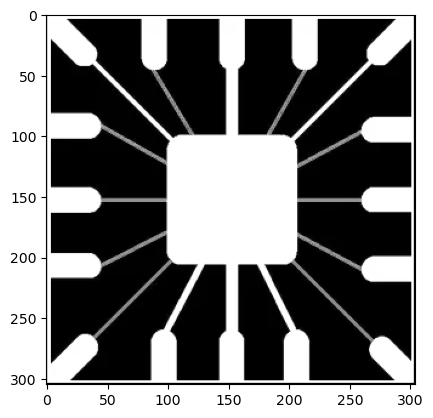

In [199]:
for i in range(c, h-c):
    for j in range(c, w-c):
        temp = img5[i-c:i+c+1, j-c:j+c+1]
        l = temp * kn
        
        img_dialation[i][j] = np.max(l)
        
plt.imshow(img_dialation, cmap = 'gray')

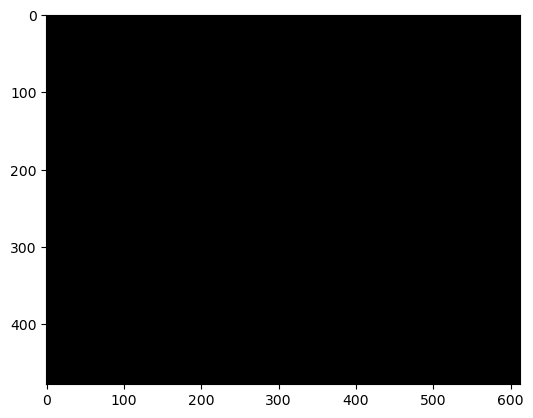

In [211]:
xor2 = cv2.bitwise_xor(img1,img3)
plt.imshow(xor2, cmap = 'gray')